# <b>Project Name - Analysis of Charging Stations in Germany</b>
## <b>Project Type - Exploratory Data Analysis (EDA)</b>
## <b>Contribution - Indiviual</b>
## <b>Name - Tejasvi Singh</b>
## <b>GitHub Link:</b> https://github.com/MsTejasviSingh
## <b>Purpose of Analysis:</b>
#### The adoption of electric vehicles (EVs), also known as electric cars, has been steadily increasing globally. Notably, Germany has emerged as a leading European market for EV sales, largely due to the proactive initiatives pursued by the German government. These initiatives encompass a range of measures, such as subsidies and tax incentives aimed at stimulating consumer interest and uptake of EVs, thereby contributing to a significant upsurge in demand within the German market. 
#### As a result of these initiatives, there has been a noticeable spike in consumer interest and demand for EVs in Germany, a promising sign for the future of sustainable transportation. Tesla has emerged as a particularly popular choice among buyers, and prominent German automobile manufacturers including Volkswagen, BMW, and Mercedes-Benz have made substantial investments in the research and development of electric vehicles. This growing interest and demand for environmentally friendly mobility options is a positive trend that is shaping the future of transportation in Germany.

## <div style="text-align: center;">Import libraries</div>

In [36]:
import numpy as np
import pandas as pd
import geopandas as gpd
import plotly.express as px
import warnings 
warnings.filterwarnings('ignore')

## <div style="text-align: center;">Load the Data</div>

In [37]:
df = pd.read_csv(r"C:\Users\mstej\Desktop\Tejee\edoxi\Data Analytics\project\charging_data.csv")

## <div style="text-align: center;">Data Overview</div>

In [38]:
df.head()

,Unnamed: 0,betreiber,art_der_ladeeinrichung,anzahl_ladepunkte,anschlussleistung,steckertypen1,steckertypen2,steckertypen3,steckertypen4,p1_kw,...,p4_kw,kreis_kreisfreie_stadt,ort,postleitzahl,strasse,hausnummer,adresszusatz,inbetriebnahmedatum,breitengrad,laengengrad
0,0,GGEW AG,Normalladeeinrichtung,1,4.6,AC Steckdose Typ 2,NaN,NaN,NaN,4.6,...,NaN,Landkreis Bergstraße,Lorsch,64653,Klosterstr.,23,NaN,2017-01-02,49.653064,8.572109
1,1,Pfalzwerke AG,Schnellladeeinrichtung,2,75.0,AC Steckdose Typ 2,DC Kupplung Combo,NaN,NaN,22.0,...,NaN,Landkreis Bergstraße,Lorsch,64653,Nibelungenstraße,135-137,NaN,2021-04-27,49.652969,8.554764
2,2,ENTEGA Energie GmbH,Normalladeeinrichtung,2,44.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,...,NaN,Landkreis Bergstraße,Fürth,64658,Krumbacher Str.,39,NaN,2017-11-21,49.658037,8.787881
3,3,Entega Plus GmbH,Normalladeeinrichtung,2,22.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,...,NaN,Landkreis Bergstraße,Fürth,64658,Erbacher Str.,102,a,2022-04-08,49.663670,8.796830
4,4,Entega Plus GmbH,Normalladeeinrichtung,2,22.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,...,NaN,Landkreis Bergstraße,Fürth,64658,Schulstr.,12,NaN,2022-04-08,49.646360,8.781410


In [39]:
df.shape

(36770, 22)

In [40]:
df.describe()

,Unnamed: 0,anzahl_ladepunkte,anschlussleistung,p1_kw,p2_kw,p3_kw,p4_kw,postleitzahl,breitengrad,laengengrad
count,36770.000000,36770.000000,36770.000000,36770.000000,31129.000000,2233.000000,1131.000000,36770.000000,36770.000000,36770.000000
mean,18384.500000,1.938075,53.879393,37.648928,38.365378,32.406879,26.196729,54564.223117,50.562816,9.751840
std,10614.729036,0.550034,64.178987,58.958237,58.080733,40.314259,39.295098,27390.091752,1.828351,2.026769
min,0.000000,1.000000,2.000000,1.000000,2.000000,2.000000,2.300000,1062.000000,47.284400,5.243745
25%,9192.250000,2.000000,22.000000,22.000000,22.000000,22.000000,22.000000,31137.000000,48.833821,8.249386
50%,18384.500000,2.000000,44.000000,22.000000,22.000000,22.000000,22.000000,56357.000000,50.661428,9.470774
75%,27576.750000,2.000000,44.000000,22.000000,22.000000,22.000000,22.000000,79117.000000,51.992060,11.462498
max,36769.000000,4.000000,1200.000000,360.000000,360.000000,360.000000,360.000000,99991.000000,55.019600,15.543810


In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36770 entries, 0 to 36769
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Unnamed: 0              36770 non-null  int64  
 1   betreiber               36770 non-null  object 
 2   art_der_ladeeinrichung  36770 non-null  object 
 3   anzahl_ladepunkte       36770 non-null  int64  
 4   anschlussleistung       36770 non-null  float64
 5   steckertypen1           36770 non-null  object 
 6   steckertypen2           31111 non-null  object 
 7   steckertypen3           2233 non-null   object 
 8   steckertypen4           1132 non-null   object 
 9   p1_kw                   36770 non-null  float64
 10  p2_kw                   31129 non-null  float64
 11  p3_kw                   2233 non-null   float64
 12  p4_kw                   1131 non-null   float64
 13  kreis_kreisfreie_stadt  36770 non-null  object 
 14  ort                     36770 non-null

##### The column <b>Commissioning Date (inbetriebnahmedatum)</b> in dataframe is curreinly a <b>string-type oject.</b> Hence, we will need to convert it into the appropriate DateTime data type

In [42]:
df['inbetriebnahmedatum'] = pd.to_datetime(df['inbetriebnahmedatum'])
df

,Unnamed: 0,betreiber,art_der_ladeeinrichung,anzahl_ladepunkte,anschlussleistung,steckertypen1,steckertypen2,steckertypen3,steckertypen4,p1_kw,...,p4_kw,kreis_kreisfreie_stadt,ort,postleitzahl,strasse,hausnummer,adresszusatz,inbetriebnahmedatum,breitengrad,laengengrad
0,0,GGEW AG,Normalladeeinrichtung,1,4.6,AC Steckdose Typ 2,NaN,NaN,NaN,4.6,...,NaN,Landkreis Bergstraße,Lorsch,64653,Klosterstr.,23,NaN,2017-01-02,49.653064,8.572109
1,1,Pfalzwerke AG,Schnellladeeinrichtung,2,75.0,AC Steckdose Typ 2,DC Kupplung Combo,NaN,NaN,22.0,...,NaN,Landkreis Bergstraße,Lorsch,64653,Nibelungenstraße,135-137,NaN,2021-04-27,49.652969,8.554764
2,2,ENTEGA Energie GmbH,Normalladeeinrichtung,2,44.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,...,NaN,Landkreis Bergstraße,Fürth,64658,Krumbacher Str.,39,NaN,2017-11-21,49.658037,8.787881
3,3,Entega Plus GmbH,Normalladeeinrichtung,2,22.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,...,NaN,Landkreis Bergstraße,Fürth,64658,Erbacher Str.,102,a,2022-04-08,49.663670,8.796830
4,4,Entega Plus GmbH,Normalladeeinrichtung,2,22.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,...,NaN,Landkreis Bergstraße,Fürth,64658,Schulstr.,12,NaN,2022-04-08,49.646360,8.781410
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36765,36765,Stadtwerke Leipzig GmbH,Normalladeeinrichtung,2,30.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,...,NaN,Kreisfreie Stadt Leipzig,Leipzig,4277,Bornaische Straße,108,NaN,2016-06-01,51.301227,12.384566
36766,36766,Stadtwerke Leipzig GmbH,Normalladeeinrichtung,2,30.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,...,NaN,Kreisfreie Stadt Leipzig,Leipzig,4277,Scheffelstraße,35,NaN,2016-06-01,51.311695,12.372912
36767,36767,Stadtwerke Leipzig GmbH,Normalladeeinrichtung,2,30.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,...,NaN,Kreisfreie Stadt Leipzig,Leipzig,4277,Bornaische Straße,55,NaN,2018-07-05,51.305046,12.382487
36768,36768,Stadtwerke Leipzig GmbH,Normalladeeinrichtung,2,30.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,...,NaN,Kreisfreie Stadt Leipzig,Leipzig,4277,Richard Lehmann Straße,120,NaN,2019-08-12,51.314325,12.397213


In [43]:
df.dtypes

Unnamed: 0                         int64
betreiber                         object
art_der_ladeeinrichung            object
anzahl_ladepunkte                  int64
anschlussleistung                float64
steckertypen1                     object
steckertypen2                     object
steckertypen3                     object
steckertypen4                     object
p1_kw                            float64
p2_kw                            float64
p3_kw                            float64
p4_kw                            float64
kreis_kreisfreie_stadt            object
ort                               object
postleitzahl                       int64
strasse                           object
hausnummer                        object
adresszusatz                      object
inbetriebnahmedatum       datetime64[ns]
breitengrad                      float64
laengengrad                      float64
dtype: object

##### Thus, here the column <b>Commissioning date(inbetriebnahmedatum)</b> has been converted to datetime64[ns] dtype

In [44]:
df.isnull().sum()

Unnamed: 0                    0
betreiber                     0
art_der_ladeeinrichung        0
anzahl_ladepunkte             0
anschlussleistung             0
steckertypen1                 0
steckertypen2              5659
steckertypen3             34537
steckertypen4             35638
p1_kw                         0
p2_kw                      5641
p3_kw                     34537
p4_kw                     35639
kreis_kreisfreie_stadt        0
ort                           0
postleitzahl                  0
strasse                       0
hausnummer                    0
adresszusatz              32147
inbetriebnahmedatum           0
breitengrad                   0
laengengrad                   0
dtype: int64

#### <b>Next steps:</b>
##### <b>Unamed: 0</b> is not needed as it is a repeat of the indexing, <b>adresszusatz</b> is just an additional address, therefore these two columns can be removed
##### <b>Steckertypen2, steckertypen3, and steckertypen4</b> are additional optional fields; hence, they have missing data, and these columns can be removed.
##### Similar to steckertypen2, <b>p2_kw, p3_kw and p4_kw</b> are also additional data and can be removed
##### Since all the heading are in German for easy understanding of data we will rename the headers in English 

## <div style="text-align: center;">Data Transformation</d>

In [45]:
df.columns

Index(['Unnamed: 0', 'betreiber', 'art_der_ladeeinrichung',
       'anzahl_ladepunkte', 'anschlussleistung', 'steckertypen1',
       'steckertypen2', 'steckertypen3', 'steckertypen4', 'p1_kw', 'p2_kw',
       'p3_kw', 'p4_kw', 'kreis_kreisfreie_stadt', 'ort', 'postleitzahl',
       'strasse', 'hausnummer', 'adresszusatz', 'inbetriebnahmedatum',
       'breitengrad', 'laengengrad'],
      dtype='object')

In [46]:
df=df.drop(['Unnamed: 0', 'adresszusatz'], axis=1)
df

,betreiber,art_der_ladeeinrichung,anzahl_ladepunkte,anschlussleistung,steckertypen1,steckertypen2,steckertypen3,steckertypen4,p1_kw,p2_kw,p3_kw,p4_kw,kreis_kreisfreie_stadt,ort,postleitzahl,strasse,hausnummer,inbetriebnahmedatum,breitengrad,laengengrad
0,GGEW AG,Normalladeeinrichtung,1,4.6,AC Steckdose Typ 2,NaN,NaN,NaN,4.6,NaN,NaN,NaN,Landkreis Bergstraße,Lorsch,64653,Klosterstr.,23,2017-01-02,49.653064,8.572109
1,Pfalzwerke AG,Schnellladeeinrichtung,2,75.0,AC Steckdose Typ 2,DC Kupplung Combo,NaN,NaN,22.0,50.0,NaN,NaN,Landkreis Bergstraße,Lorsch,64653,Nibelungenstraße,135-137,2021-04-27,49.652969,8.554764
2,ENTEGA Energie GmbH,Normalladeeinrichtung,2,44.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,22.0,NaN,NaN,Landkreis Bergstraße,Fürth,64658,Krumbacher Str.,39,2017-11-21,49.658037,8.787881
3,Entega Plus GmbH,Normalladeeinrichtung,2,22.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,22.0,NaN,NaN,Landkreis Bergstraße,Fürth,64658,Erbacher Str.,102,2022-04-08,49.663670,8.796830
4,Entega Plus GmbH,Normalladeeinrichtung,2,22.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,22.0,NaN,NaN,Landkreis Bergstraße,Fürth,64658,Schulstr.,12,2022-04-08,49.646360,8.781410
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36765,Stadtwerke Leipzig GmbH,Normalladeeinrichtung,2,30.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,22.0,NaN,NaN,Kreisfreie Stadt Leipzig,Leipzig,4277,Bornaische Straße,108,2016-06-01,51.301227,12.384566
36766,Stadtwerke Leipzig GmbH,Normalladeeinrichtung,2,30.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,22.0,NaN,NaN,Kreisfreie Stadt Leipzig,Leipzig,4277,Scheffelstraße,35,2016-06-01,51.311695,12.372912
36767,Stadtwerke Leipzig GmbH,Normalladeeinrichtung,2,30.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,22.0,NaN,NaN,Kreisfreie Stadt Leipzig,Leipzig,4277,Bornaische Straße,55,2018-07-05,51.305046,12.382487
36768,Stadtwerke Leipzig GmbH,Normalladeeinrichtung,2,30.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,22.0,NaN,NaN,Kreisfreie Stadt Leipzig,Leipzig,4277,Richard Lehmann Straße,120,2019-08-12,51.314325,12.397213


In [47]:
dict={'betreiber': 'Operator', 
      'art_der_ladeeinrichung': 'Charging_facility_type',
      'anzahl_ladepunkte': 'No_of_Charging_points', 
      'anschlussleistung': 'Connected_Load', 
      'steckertypen1': 'Plug_types_1', 
      'steckertypen2': 'Plug_types_2',
      'steckertypen3': 'Plug_types_3',
      'steckertypen4': 'Plug_types_4',
      'p1_kw': 'Power_capacity_kw1',
      'p2_kw': 'Power_capacity_kw2',
      'p3_kw': 'Power_capacity_kw3',
      'p4_kw': 'Power_capacity_kw4',
      'kreis_kreisfreie_stadt': 'District', 
      'ort': 'Place', 
      'postleitzahl': 'Postal_Code', 
      'strasse': 'Street',	
      'hausnummer': 'House_No.',	
      'inbetriebnahmedatum': 'Commissioning_date',	
      'breitengrad': 'Latitude',	
      'laengengrad': 'Longitude'}
df.rename(columns=dict, inplace=True)
display(df)

,Operator,Charging_facility_type,No_of_Charging_points,Connected_Load,Plug_types_1,Plug_types_2,Plug_types_3,Plug_types_4,Power_capacity_kw1,Power_capacity_kw2,Power_capacity_kw3,Power_capacity_kw4,District,Place,Postal_Code,Street,House_No.,Commissioning_date,Latitude,Longitude
0,GGEW AG,Normalladeeinrichtung,1,4.6,AC Steckdose Typ 2,NaN,NaN,NaN,4.6,NaN,NaN,NaN,Landkreis Bergstraße,Lorsch,64653,Klosterstr.,23,2017-01-02,49.653064,8.572109
1,Pfalzwerke AG,Schnellladeeinrichtung,2,75.0,AC Steckdose Typ 2,DC Kupplung Combo,NaN,NaN,22.0,50.0,NaN,NaN,Landkreis Bergstraße,Lorsch,64653,Nibelungenstraße,135-137,2021-04-27,49.652969,8.554764
2,ENTEGA Energie GmbH,Normalladeeinrichtung,2,44.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,22.0,NaN,NaN,Landkreis Bergstraße,Fürth,64658,Krumbacher Str.,39,2017-11-21,49.658037,8.787881
3,Entega Plus GmbH,Normalladeeinrichtung,2,22.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,22.0,NaN,NaN,Landkreis Bergstraße,Fürth,64658,Erbacher Str.,102,2022-04-08,49.663670,8.796830
4,Entega Plus GmbH,Normalladeeinrichtung,2,22.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,22.0,NaN,NaN,Landkreis Bergstraße,Fürth,64658,Schulstr.,12,2022-04-08,49.646360,8.781410
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36765,Stadtwerke Leipzig GmbH,Normalladeeinrichtung,2,30.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,22.0,NaN,NaN,Kreisfreie Stadt Leipzig,Leipzig,4277,Bornaische Straße,108,2016-06-01,51.301227,12.384566
36766,Stadtwerke Leipzig GmbH,Normalladeeinrichtung,2,30.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,22.0,NaN,NaN,Kreisfreie Stadt Leipzig,Leipzig,4277,Scheffelstraße,35,2016-06-01,51.311695,12.372912
36767,Stadtwerke Leipzig GmbH,Normalladeeinrichtung,2,30.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,22.0,NaN,NaN,Kreisfreie Stadt Leipzig,Leipzig,4277,Bornaische Straße,55,2018-07-05,51.305046,12.382487
36768,Stadtwerke Leipzig GmbH,Normalladeeinrichtung,2,30.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,22.0,NaN,NaN,Kreisfreie Stadt Leipzig,Leipzig,4277,Richard Lehmann Straße,120,2019-08-12,51.314325,12.397213


In [48]:
df=df.replace({'Normalladeeinrichtung':'Normal Charging', 'Schnellladeeinrichtung':'Fast Charging'})
df

,Operator,Charging_facility_type,No_of_Charging_points,Connected_Load,Plug_types_1,Plug_types_2,Plug_types_3,Plug_types_4,Power_capacity_kw1,Power_capacity_kw2,Power_capacity_kw3,Power_capacity_kw4,District,Place,Postal_Code,Street,House_No.,Commissioning_date,Latitude,Longitude
0,GGEW AG,Normal Charging,1,4.6,AC Steckdose Typ 2,NaN,NaN,NaN,4.6,NaN,NaN,NaN,Landkreis Bergstraße,Lorsch,64653,Klosterstr.,23,2017-01-02,49.653064,8.572109
1,Pfalzwerke AG,Fast Charging,2,75.0,AC Steckdose Typ 2,DC Kupplung Combo,NaN,NaN,22.0,50.0,NaN,NaN,Landkreis Bergstraße,Lorsch,64653,Nibelungenstraße,135-137,2021-04-27,49.652969,8.554764
2,ENTEGA Energie GmbH,Normal Charging,2,44.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,22.0,NaN,NaN,Landkreis Bergstraße,Fürth,64658,Krumbacher Str.,39,2017-11-21,49.658037,8.787881
3,Entega Plus GmbH,Normal Charging,2,22.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,22.0,NaN,NaN,Landkreis Bergstraße,Fürth,64658,Erbacher Str.,102,2022-04-08,49.663670,8.796830
4,Entega Plus GmbH,Normal Charging,2,22.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,22.0,NaN,NaN,Landkreis Bergstraße,Fürth,64658,Schulstr.,12,2022-04-08,49.646360,8.781410
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36765,Stadtwerke Leipzig GmbH,Normal Charging,2,30.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,22.0,NaN,NaN,Kreisfreie Stadt Leipzig,Leipzig,4277,Bornaische Straße,108,2016-06-01,51.301227,12.384566
36766,Stadtwerke Leipzig GmbH,Normal Charging,2,30.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,22.0,NaN,NaN,Kreisfreie Stadt Leipzig,Leipzig,4277,Scheffelstraße,35,2016-06-01,51.311695,12.372912
36767,Stadtwerke Leipzig GmbH,Normal Charging,2,30.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,22.0,NaN,NaN,Kreisfreie Stadt Leipzig,Leipzig,4277,Bornaische Straße,55,2018-07-05,51.305046,12.382487
36768,Stadtwerke Leipzig GmbH,Normal Charging,2,30.0,AC Steckdose Typ 2,AC Steckdose Typ 2,NaN,NaN,22.0,22.0,NaN,NaN,Kreisfreie Stadt Leipzig,Leipzig,4277,Richard Lehmann Straße,120,2019-08-12,51.314325,12.397213


In [49]:
new_df = ['Operator', 'Charging_facility_type', 'No_of_Charging_points',
          'Plug_types_1', 'Power_capacity_kw1', 'District', 'Place',
          'Postal_Code', 'House_No.', 'Commissioning_date', 'Latitude', 'Longitude']
df = df[new_df].copy()

In [50]:
df

,Operator,Charging_facility_type,No_of_Charging_points,Plug_types_1,Power_capacity_kw1,District,Place,Postal_Code,House_No.,Commissioning_date,Latitude,Longitude
0,GGEW AG,Normal Charging,1,AC Steckdose Typ 2,4.6,Landkreis Bergstraße,Lorsch,64653,23,2017-01-02,49.653064,8.572109
1,Pfalzwerke AG,Fast Charging,2,AC Steckdose Typ 2,22.0,Landkreis Bergstraße,Lorsch,64653,135-137,2021-04-27,49.652969,8.554764
2,ENTEGA Energie GmbH,Normal Charging,2,AC Steckdose Typ 2,22.0,Landkreis Bergstraße,Fürth,64658,39,2017-11-21,49.658037,8.787881
3,Entega Plus GmbH,Normal Charging,2,AC Steckdose Typ 2,22.0,Landkreis Bergstraße,Fürth,64658,102,2022-04-08,49.663670,8.796830
4,Entega Plus GmbH,Normal Charging,2,AC Steckdose Typ 2,22.0,Landkreis Bergstraße,Fürth,64658,12,2022-04-08,49.646360,8.781410
...,...,...,...,...,...,...,...,...,...,...,...,...
36765,Stadtwerke Leipzig GmbH,Normal Charging,2,AC Steckdose Typ 2,22.0,Kreisfreie Stadt Leipzig,Leipzig,4277,108,2016-06-01,51.301227,12.384566
36766,Stadtwerke Leipzig GmbH,Normal Charging,2,AC Steckdose Typ 2,22.0,Kreisfreie Stadt Leipzig,Leipzig,4277,35,2016-06-01,51.311695,12.372912
36767,Stadtwerke Leipzig GmbH,Normal Charging,2,AC Steckdose Typ 2,22.0,Kreisfreie Stadt Leipzig,Leipzig,4277,55,2018-07-05,51.305046,12.382487
36768,Stadtwerke Leipzig GmbH,Normal Charging,2,AC Steckdose Typ 2,22.0,Kreisfreie Stadt Leipzig,Leipzig,4277,120,2019-08-12,51.314325,12.397213


In [51]:
df=df.dropna(axis=1, how='all')
df

,Operator,Charging_facility_type,No_of_Charging_points,Plug_types_1,Power_capacity_kw1,District,Place,Postal_Code,House_No.,Commissioning_date,Latitude,Longitude
0,GGEW AG,Normal Charging,1,AC Steckdose Typ 2,4.6,Landkreis Bergstraße,Lorsch,64653,23,2017-01-02,49.653064,8.572109
1,Pfalzwerke AG,Fast Charging,2,AC Steckdose Typ 2,22.0,Landkreis Bergstraße,Lorsch,64653,135-137,2021-04-27,49.652969,8.554764
2,ENTEGA Energie GmbH,Normal Charging,2,AC Steckdose Typ 2,22.0,Landkreis Bergstraße,Fürth,64658,39,2017-11-21,49.658037,8.787881
3,Entega Plus GmbH,Normal Charging,2,AC Steckdose Typ 2,22.0,Landkreis Bergstraße,Fürth,64658,102,2022-04-08,49.663670,8.796830
4,Entega Plus GmbH,Normal Charging,2,AC Steckdose Typ 2,22.0,Landkreis Bergstraße,Fürth,64658,12,2022-04-08,49.646360,8.781410
...,...,...,...,...,...,...,...,...,...,...,...,...
36765,Stadtwerke Leipzig GmbH,Normal Charging,2,AC Steckdose Typ 2,22.0,Kreisfreie Stadt Leipzig,Leipzig,4277,108,2016-06-01,51.301227,12.384566
36766,Stadtwerke Leipzig GmbH,Normal Charging,2,AC Steckdose Typ 2,22.0,Kreisfreie Stadt Leipzig,Leipzig,4277,35,2016-06-01,51.311695,12.372912
36767,Stadtwerke Leipzig GmbH,Normal Charging,2,AC Steckdose Typ 2,22.0,Kreisfreie Stadt Leipzig,Leipzig,4277,55,2018-07-05,51.305046,12.382487
36768,Stadtwerke Leipzig GmbH,Normal Charging,2,AC Steckdose Typ 2,22.0,Kreisfreie Stadt Leipzig,Leipzig,4277,120,2019-08-12,51.314325,12.397213


In [52]:
#check if there are any duplicate rows in the database
df = df.drop_duplicates()
df.count()

Operator                  36201
Charging_facility_type    36201
No_of_Charging_points     36201
Plug_types_1              36201
Power_capacity_kw1        36201
District                  36201
Place                     36201
Postal_Code               36201
House_No.                 36201
Commissioning_date        36201
Latitude                  36201
Longitude                 36201
dtype: int64

##### <b>Hence, there are no duplicate rows in the database</b>

In [53]:
#checking if there are any null values present 
df.isnull().sum()

Operator                  0
Charging_facility_type    0
No_of_Charging_points     0
Plug_types_1              0
Power_capacity_kw1        0
District                  0
Place                     0
Postal_Code               0
House_No.                 0
Commissioning_date        0
Latitude                  0
Longitude                 0
dtype: int64

##### <b>This shows that our current data set has NaN (Not a Number) or None values</b>

In [54]:
df.to_csv('charging_data_clean.csv')

##### The transformed data must be stored in a new .csv file to avoid the need for repeating the above process in the future.

## <div style="text-align: center;">Exploratory Data Analysis</d>

In [55]:
charging_points = df['No_of_Charging_points'].sum()
charging_points

70198

In [56]:
description_charging_points = df['No_of_Charging_points'].describe()
description_charging_points

count    36201.000000
mean         1.939118
std          0.551387
min          1.000000
25%          2.000000
50%          2.000000
75%          2.000000
max          4.000000
Name: No_of_Charging_points, dtype: float64

##### This output provides with a <b>summary of charhing points</b> in Germany.
##### <b>Mean</b> value of approximately <b>1.94</b> suggests that on an average there are <b>less than two charging points</b> avaliable per location.
##### <b>Minimum</b> value is <b>1</b> which shows that only one charhing point is available and <b>maximum</b> indicated that there are <b>4</b> point available per location

In [57]:
charging_stations_place = df['Place'].value_counts().nlargest(15)
print('Places having largest number of charging station:\n')
print(charging_stations_place)

Places having largest number of charging station:

Place
München         1399
Berlin          1220
Hamburg          933
Stuttgart        696
Hannover         470
Dortmund         451
Düsseldorf       358
Sindelfingen     329
Regensburg       303
Köln             302
Essen            283
Wolfsburg        272
Dresden          254
Bremen           244
Leipzig          244
Name: count, dtype: int64


In [58]:
charging_stations_operators = df['Operator'].value_counts().nlargest(50)
print('Top 50 operators:\n')
print(charging_stations_operators)

Top 50 operators:

Operator
E.ON Drive GmbH                                                          2152
EnBW mobility+ AG und Co.KG                                              1992
EWE Go GmbH                                                               892
Mercedes-Benz AG                                                          825
Westenergie Metering GmbH                                                 794
Stromnetz Hamburg GmbH                                                    700
SWM Versorgungs GmbH                                                      598
Privatperson                                                              568
ALDI SÜD                                                                  557
Allego GmbH                                                               552
Berliner Stadtwerke KommunalPartner GmbH                                  526
Mer Germany GmbH                                                          455
Lidl                                

In [59]:
unique_operator = df['Operator'].nunique()
print(unique_operator)

4772


In [60]:
place_operator = df.groupby("Place")["Operator"].nunique()
place_operator = place_operator.sort_values().nlargest(50)
print('Operators in various places:\n')
print(place_operator)

Operators in various places:

Place
Berlin               86
Hamburg              67
München              58
Stuttgart            43
Dresden              38
Düsseldorf           38
Bremen               36
Köln                 36
Leipzig              35
Chemnitz             33
Münster              30
Dortmund             29
Augsburg             27
Magdeburg            27
Paderborn            26
Essen                26
Bochum               25
Kiel                 25
Frankfurt am Main    24
Hannover             24
Ingolstadt           24
Nürnberg             24
Heilbronn            24
Karlsruhe            23
Aachen               23
Regensburg           22
Erfurt               22
Mannheim             21
Duisburg             21
Frankfurt            21
Bielefeld            21
Bocholt              19
Braunschweig         19
Rostock              18
Passau               18
Wolfsburg            18
Mönchengladbach      18
Wiesbaden            18
Koblenz              17
Gelsenkirchen        17
Bayr

##### The top 5 listes countries <b>Berlin, Hamburg, Munich, Stuttgart and Dreden</b> have <b>86, 67, 58, 43 and 38 unique values respectively.</b>
##### This indicated that a higher demand of operators are potentially required in these areas.

In [61]:
power_capacity = df.groupby("Operator")["Power_capacity_kw1"].mean()
power_capacity = power_capacity.sort_values().nlargest(50)
print('Power capacity by various operators:\n')
print(power_capacity)

Power capacity by various operators:

Operator
Porsche Zentrum Recklinghausen                                         350.000000
Porsche Zentrum Hamburg                                                350.000000
Porsche Zentrum Soest Sportwagen Vertriebsgesellschaft Soest           350.000000
IONITY GmbH                                                            350.000000
Porsche Zentrum Dortmund                                               350.000000
Porsche Zentrum Berlin-Adlershof, Porsche Niederlassung Berlin GmbH    350.000000
Porsche Zentrum Bamberg                                                350.000000
Porsche Zentrum Aschaffenburg  HENRICI Sportwagen GmbH                 350.000000
Audi charging hub                                                      320.000000
Porsche Zentrum Kassel Glinicke Sportwagen GmbH                        320.000000
Porsche Zentrum Garmisch-Partenkirchen                                 320.000000
Porsche Zentrum Düsseldorf                         

##### Power capacity of <b> 350kW and 320kW is consistant with Operator: Porsche Zentrum</b>, this means they potentially have faster charging time. 

## <div style="text-align: center;">Data Visualization</div>

In [62]:
print(f'Total charging points: {df["No_of_Charging_points"].sum()}')

Total charging points: 70198


In [63]:
fig = px.histogram(df, x='No_of_Charging_points', y='Power_capacity_kw1',
                 labels={'No_of_Charging_points':'Number of Charging Points', 'Power_capacity_kw1':'Power Capacity (kW)'},
                 title="Charging Points vs Power Capacity")
fig.show()


##### From this above histogram it is clear that there are <b>two charging points per station</b>

In [64]:
fig = px.histogram(df, x='Power_capacity_kw1', nbins=10, 
                   labels={'Power_capacity_kw1':'Power Capacity (kW)'},
                   title="Distribution of Power Connection Capacity")
fig.show()

In [65]:
fig = px.box(df, x='Charging_facility_type', y='Power_capacity_kw1',
             labels={'Charging_facility_type':'Charging Facility Type', 'Power_capacity_kw1':'Power Capacity (kW)'},
             title="Power Capacity by Charging Facility Type")
fig.show()

In [66]:
print(df['Charging_facility_type'].value_counts())
fig = px.pie(df, names='Charging_facility_type', 
             title="Distribution of Charging Facility Types")
fig.show()

Charging_facility_type
Normal Charging    30374
Fast Charging       5827
Name: count, dtype: int64


In [67]:
print(f'Station with lowest power has {df["Power_capacity_kw1"].min()}kW')
print(f'Station with highest power has {df["Power_capacity_kw1"].max()}kW')

Station with lowest power has 1.0kW
Station with highest power has 360.0kW


##### So far it can be infered that there are two types of charging stations: <b>Normal Type (Normalladeeinrichtung) & Fast Type (Schnellladeeinrichtung).</b>
##### In Germany, approximately <b>84%</b> of the stations have <b>Normal charging</b> where as the remaining <b>16% has Fast charging.</b>

In [68]:
df['year'] = df['Commissioning_date'].dt.year
df['month'] = df['Commissioning_date'].dt.month
df_month = df.groupby(['year', 'month']).size().sort_values(ascending=False).reset_index(name='count')
df_month['date'] = pd.to_datetime(df_month[['year', 'month']].assign(day=1))
df_month.sort_values(by='date', inplace=True)
fig = px.line(df_month, x='date', y='count', 
              title='Growth of charging stations by month', height=1000)
fig.show()

##### It can be infered from the graph that the <b>number of charging station have been increasing</b> since 2010.

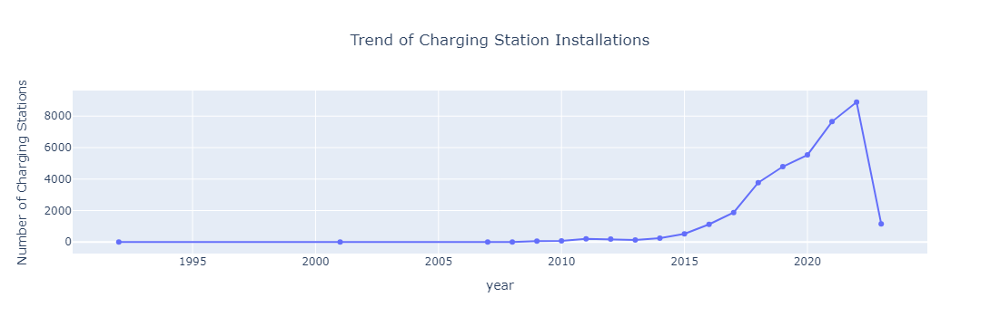

In [69]:
df_charging_stations=df['Commissioning_date'].dt.year.value_counts().sort_index().reset_index()
df_charging_stations.columns = ['year', 'Number of Charging Stations']

fig = px.line(df_charging_stations, x='year', y='Number of Charging Stations', 
              markers=True, title='Trend of Charging Station Installations')

fig.update_layout(xaxis_title='year', yaxis_title='Number of Charging Stations', 
                  title_text='Trend of Charging Station Installations', title_x=0.5)

fig.show()

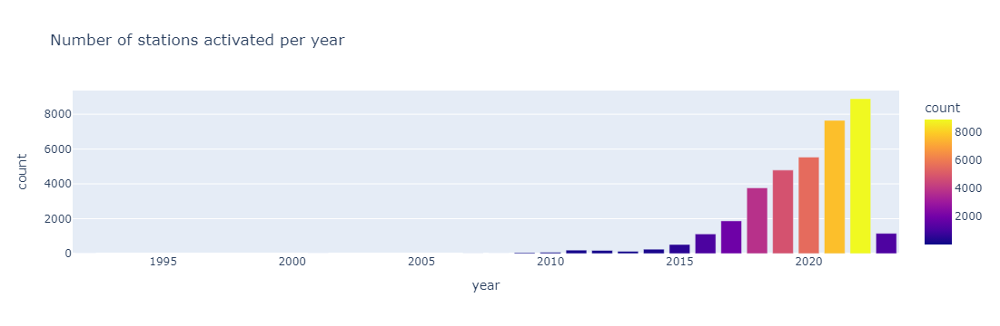

In [70]:
df['year'] = df['Commissioning_date'].dt.year
df['month'] = df['Commissioning_date'].dt.month
df_year =pd.DataFrame(df.groupby('year').size().reset_index(name='count'))

fig = px.bar(df_year,
            x='year',
            y='count',
            title='Number of stations activated per year',
            color='count')
fig.show()

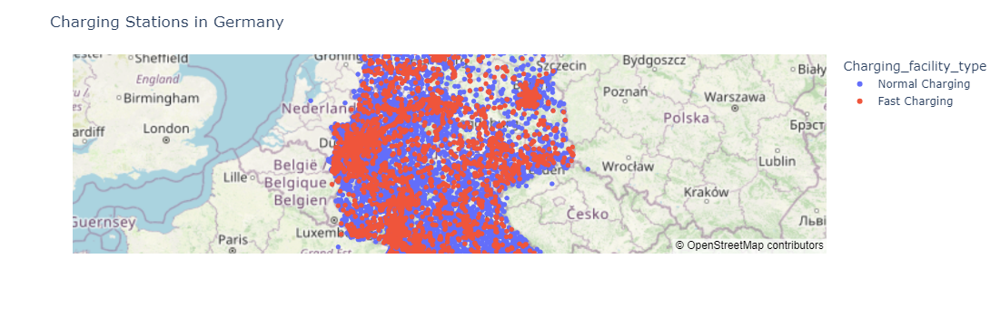

In [72]:
geometry = gpd.points_from_xy(df['Longitude'], df['Latitude'])
gdf = gpd.GeoDataFrame(df, geometry=geometry)

fig = px.scatter_mapbox(gdf, lat='Latitude', lon='Longitude', hover_name='Operator',
                        hover_data={'Power_capacity_kw1': True, 'Place': True},
                        color='Charging_facility_type', zoom=10, height=500)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(title="Charging Stations in Germany")
fig.show()